In [3]:
# connect to google drive
from google.colab import drive
drive.mount('/content/drive')
filename = '/content/drive/MyDrive/SelectedImages'

Mounted at /content/drive


# Imports

In [4]:
import csv
import numpy as np
from collections import defaultdict
from PIL import Image

# Decoding of run-length encoding

In [5]:
def rle_decode(mask_rle, shape):
    '''
    mask_rle: run-length as string formated (start length)
    shape: (height,width) of array to return
    Returns numpy array, 1 - mask, 0 - background
    '''
    s = mask_rle.split()
    starts, lengths = [np.asarray(x, dtype=int) for x in (s[0:][::2], s[1:][::2])]
    starts -= 1
    ends = starts + lengths
    img = np.zeros(shape[0]*shape[1], dtype=np.uint8)
    for lo, hi in zip(starts, ends):
         img[lo:hi] = 1
    return img.reshape(shape).T # Needed to align to RLE direction

In [6]:
import random

# get masks and store in hashmap
def get_masks(file, folder, size=100000):
    segm = csv.reader(open(file, 'r'))
    masks = {}
    img_names = set(os.listdir(folder))
    size = min(size, len(img_names))
    final_imgs = set(random.sample(img_names,size))

    next(segm)

    while True:
        try:
            curr = next(segm);
            if curr[0] not in final_imgs:
              continue
            if curr[0] not in masks:
                masks[curr[0]] = []
            masks[curr[0]].append(curr[1])
        except StopIteration:
            break

    return masks

In [7]:
def masks_decode(masks):
    for i in range(len(masks)):
        for j in range(len(masks[i])):
            masks[i][j] = rle_decode(masks[i][j], (768,768))

# Data Loader

In [8]:
from torchvision.io import read_image
from torchvision.ops.boxes import masks_to_boxes
from torchvision import tv_tensors
from torchvision.transforms.v2 import functional as F
import torch
import os

class ShipDataset(torch.utils.data.Dataset):
    def __init__(self, root, masks, transforms=None, train=True):
        self.root = root
        self.transforms = transforms
        self.imgs = list(masks.keys())
        self.masks = list(masks.values())
        if train: masks_decode(self.masks)

    def __getitem__(self, idx):
        MIN_BOX_SIZE = 1  # Minimum size of the bounding box (in pixels)
        #load image
        img_name = os.path.join(self.root, self.imgs[idx])
        image = read_image(img_name)
        masks = torch.stack([torch.tensor(m, dtype=torch.uint8) for m in self.masks[idx]])

        num_objs = len(self.masks[idx]) if sum(sum(self.masks[idx][0])) != 0 else 0
        # Initialize valid_boxes and valid_areas
        valid_boxes = []
        valid_areas = []

        image_size = F.get_size(image)

        if sum(sum(self.masks[idx][0])) != 0:
            boxes = masks_to_boxes(masks)
            for box in boxes:
                if (box[2] - box[0]) > MIN_BOX_SIZE and (box[3] - box[1]) > MIN_BOX_SIZE:
                    # Ensure box is within image boundaries
                    if box[0] >= 0 and box[1] >= 0 and box[2] <= image_size[1] and box[3] <= image_size[0]:
                        box_area = (box[3] - box[1]) * (box[2] - box[0])
                        valid_boxes.append(box)
                        valid_areas.append(box_area)
                    else:
                        print(f"Box out of bounds: {box}")
                else:
                    print(f"Invalid box dimensions: {box}")

        # Convert to torch tensors
        valid_boxes = torch.stack(valid_boxes) if valid_boxes else torch.zeros((0, 4), dtype=torch.float32)
        valid_areas = torch.tensor(valid_areas, dtype=torch.float32) if valid_areas else torch.zeros((0,), dtype=torch.float32)

        # there is only one class
        labels = torch.ones((num_objs,), dtype=torch.int64)

        image = tv_tensors.Image(image)
        iscrowd = torch.zeros((num_objs,), dtype=torch.int64)

        target = {}
        target["boxes"] = tv_tensors.BoundingBoxes(valid_boxes, format='xyxy', canvas_size=F.get_size(image))
        target["masks"] = tv_tensors.Mask(masks)
        target["labels"] = labels
        target["image_id"] = self.imgs[idx][:-4]
        target["area"] = valid_areas
        target["iscrowd"] = iscrowd

        if self.transforms is not None:
            image, target = self.transforms(image, target)

        return image, target

    def __len__(self):
        return len(self.imgs)

In [9]:
# import os
# os.system("wget https://raw.githubusercontent.com/pytorch/vision/main/references/detection/engine.py")
# os.system("wget https://raw.githubusercontent.com/pytorch/vision/main/references/detection/utils.py")
# os.system("wget https://raw.githubusercontent.com/pytorch/vision/main/references/detection/coco_utils.py")
# os.system("wget https://raw.githubusercontent.com/pytorch/vision/main/references/detection/coco_eval.py")
# os.system("wget https://raw.githubusercontent.com/pytorch/vision/main/references/detection/transforms.py")

In [10]:
from torchvision.transforms import v2 as T

def get_transforms(train):
    transforms = []
    if train:
        transforms.append(T.RandomHorizontalFlip(0.5))
    transforms.append(T.ToDtype(torch.float, scale=True))
    transforms.append(T.ToPureTensor())
    return T.Compose(transforms)

In [11]:
import utils

data_size = 5000

masks_encoded = get_masks("/content/drive/My Drive/train_ship_segmentations_v2.csv", filename, data_size)

dataset = ShipDataset(filename, masks_encoded, get_transforms(train=True))
dataset_test = ShipDataset(filename, masks_encoded, get_transforms(train=False), train=False)

indices = torch.randperm(len(dataset)).tolist()
test_size = int(len(dataset)*0.05)
data_train = torch.utils.data.Subset(dataset, indices[:-test_size])
data_test = torch.utils.data.Subset(dataset_test, indices[-test_size:])

data_loader_train = torch.utils.data.DataLoader(
    data_train,
    batch_size=2,
    shuffle=True,
    num_workers=2,
    collate_fn=utils.collate_fn
)

data_loader_test = torch.utils.data.DataLoader(
    data_test,
    batch_size=1,
    shuffle=False,
    num_workers=2,
    collate_fn=utils.collate_fn
)

<ipython-input-6-e828ac5ca6cc>:9: DeprecationWarning: Sampling from a set deprecated
since Python 3.9 and will be removed in a subsequent version.
  final_imgs = set(random.sample(img_names,size))


# Models

In [12]:
import torch
import torch.nn as nn

class SpatialAttention(nn.Module):
    def __init__(self, in_channels):
        super(SpatialAttention, self).__init__()
        # Use a 1x1 convolution to learn spatial filters
        self.conv1x1 = nn.Conv2d(in_channels, 1, kernel_size=1)

    def forward(self, x):
        # Apply the 1x1 convolution to the input feature map
        spatial_filters = self.conv1x1(x)

        # Apply softmax across the spatial dimensions (H and W)
        # Softmax needs to be applied across each spatial location
        # Reshape to (N, H*W) to apply softmax, then reshape back to (N, 1, H, W)

        N, C, H, W = spatial_filters.size()
        spatial_attention = nn.functional.softmax(spatial_filters.view(N, -1), dim=1).view(N, 1, H, W)

        # Multiply the spatial attention map with the input feature map
        # Broadcasting will apply the single-channel attention map across all input channels
        out = x * spatial_attention

        return out


In [13]:
#adding the self-attension onto the backbone
class ModifiedBackbone(nn.Module):
    def __init__(self, backbone, self_attention_layer, out_channels=256):
        super(ModifiedBackbone, self).__init__()
        self.backbone = backbone
        self.self_attention = self_attention_layer
        self.out_channels = out_channels

    def forward(self, x):
        # Get the feature maps from the backbone
        features = self.backbone(x)

        # Assuming features is an OrderedDict and we apply attention to the last feature map
        feature_key = list(features.keys())[-1]  # Get the key for the last feature map
        feature_map = features[feature_key]  # Extract the feature map

        # Apply spatial attention to the feature map
        attended_features = self.self_attention(feature_map)

        # Update the features with the attended feature map
        features[feature_key] = attended_features

        return features

In [14]:
import torchvision
from torchvision.models.detection.rpn import AnchorGenerator
from torchvision.models.detection import FasterRCNN, MaskRCNN
from torchvision.models.detection.backbone_utils import resnet_fpn_backbone

backbone = resnet_fpn_backbone('resnet101', pretrained=True)

# Create the self-attention layer
self_attention_layer = SpatialAttention(256)

# Create the modified backbone
modified_backbone = ModifiedBackbone(backbone, self_attention_layer)

anchor_sizes = ((32, 64, 128, 256, 512))
aspect_ratios = ((0.5, 1.0, 2.0))

anchor_generator = AnchorGenerator(
      sizes=anchor_sizes,
      aspect_ratios=aspect_ratios
  )

roi_pooler = torchvision.ops.MultiScaleRoIAlign(
      featmap_names=['0'],
      output_size=7,
      sampling_ratio=2,
  )

mask_roi_pooler = torchvision.ops.MultiScaleRoIAlign(
    featmap_names=['0'],
    output_size=7,
    sampling_ratio=2,
)

model = MaskRCNN(
    modified_backbone,
    num_classes=2,
    rpn_anchor_generator=anchor_generator,
    box_roi_pool=roi_pooler,
    mask_roi_pool=mask_roi_pooler
  )

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:135: UserWarning: Using 'backbone_name' as positional parameter(s) is deprecated since 0.13 and may be removed in the future. Please use keyword parameter(s) instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet101_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet101_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnet101-63fe2227.pth" to /root/.cache/torch/hub/checkpoints/resnet101-

In [15]:
# # For Training
# images, targets = next(iter(data_loader))
# images = list(image for image in images)
# targets = [{k: v for k, v in t.items()} for t in targets]
# output = model(images,targets)   # Returns losses and detections
# print(output)
# # loss = loss_function(output, targets)

# #For inference
# model.eval()
# x = [torch.rand(3, 786, 786),torch.rand(3, 786, 786)]
# predictions = model(x)           # Returns predictions
# print(predictions[0])

In [16]:
# selecting device
device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')
device

device(type='cuda')

In [17]:
from engine import train_one_epoch, evaluate

model.to(device)

# construct an optimizer
params = [p for p in model.parameters() if p.requires_grad]
optimizer = torch.optim.SGD(
    params,
    lr=0.005,
    momentum=0.9,
    weight_decay=0.0005
)

# and a learning rate scheduler
lr_scheduler = torch.optim.lr_scheduler.StepLR(
    optimizer,
    step_size=3,
    gamma=0.1
)

num_epoch = 10

for epoch in range(num_epoch):
    train_one_epoch(model, optimizer, data_loader_train, device, epoch, print_freq=100)
    lr_scheduler.step()
    evaluate(model, data_loader_test, device=device)

Epoch: [0]  [   0/2375]  eta: 2:35:27  lr: 0.000010  loss: 1.3583 (1.3583)  loss_classifier: 0.6588 (0.6588)  loss_box_reg: 0.0000 (0.0000)  loss_mask: 0.0000 (0.0000)  loss_objectness: 0.6995 (0.6995)  loss_rpn_box_reg: 0.0000 (0.0000)  time: 3.9273  data: 0.8562  max mem: 2245
Epoch: [0]  [ 100/2375]  eta: 1:27:46  lr: 0.000509  loss: 0.4024 (1.2915)  loss_classifier: 0.0103 (0.1930)  loss_box_reg: 0.0000 (0.0061)  loss_mask: 0.0000 (0.5253)  loss_objectness: 0.1523 (0.5192)  loss_rpn_box_reg: 0.0000 (0.0479)  time: 0.6463  data: 0.0098  max mem: 2486
Epoch: [0]  [ 200/2375]  eta: 0:53:34  lr: 0.001009  loss: 0.0487 (0.8677)  loss_classifier: 0.0035 (0.1070)  loss_box_reg: 0.0000 (0.0093)  loss_mask: 0.0000 (0.4085)  loss_objectness: 0.0393 (0.3061)  loss_rpn_box_reg: 0.0000 (0.0367)  time: 0.6207  data: 0.0123  max mem: 2486
Epoch: [0]  [ 300/2375]  eta: 0:41:18  lr: 0.001508  loss: 0.6439 (0.7486)  loss_classifier: 0.0231 (0.0796)  loss_box_reg: 0.0006 (0.0106)  loss_mask: 0.5239 (

RuntimeError: ignored

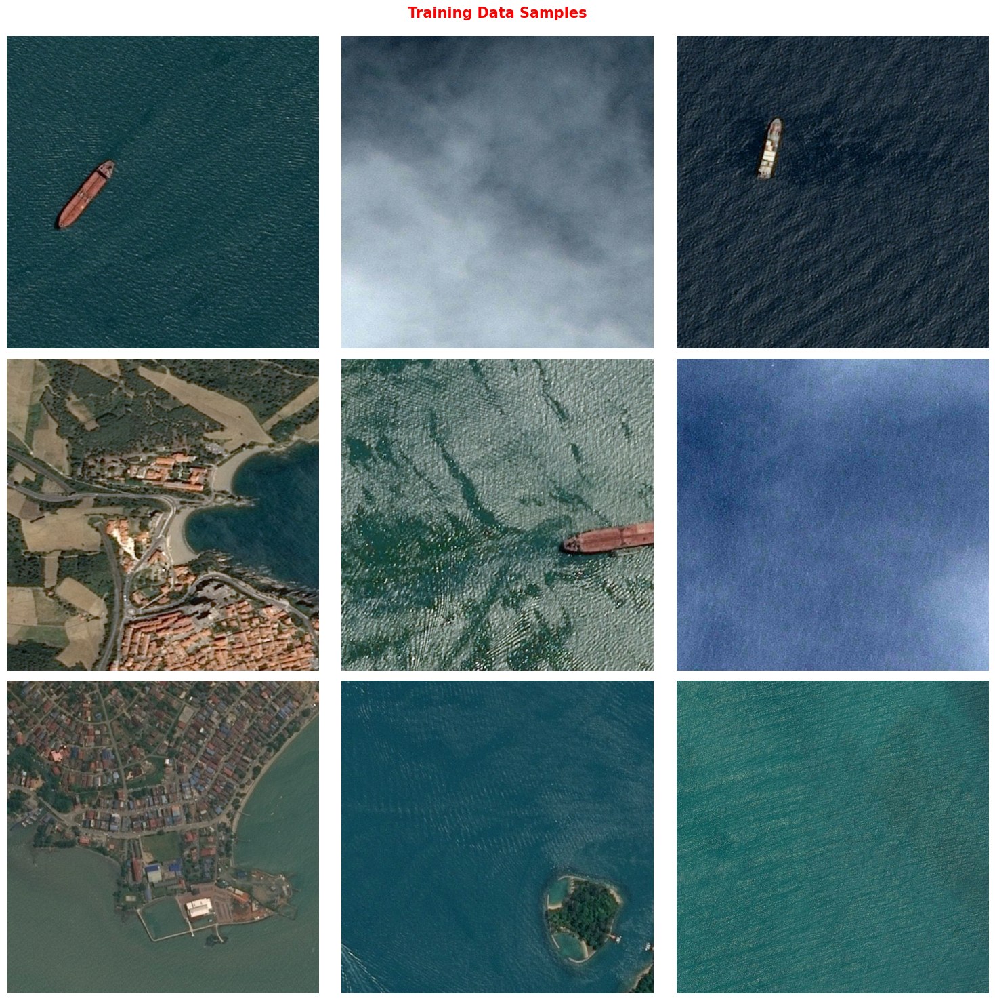

In [80]:
import matplotlib.pyplot as plt
from skimage.io import imread
import torchvision.transforms.functional as transform
from torchvision.utils import draw_bounding_boxes, draw_segmentation_masks

#grabbing sample images

imgs = []

# original graph
plt.figure(figsize=(15,15))
plt.suptitle("Training Data Samples\n", weight='bold', fontsize=15, color='r')

cntr = 9
train_size = int(len(dataset) * 0.95)
img_id = [random.randint(0, train_size) for _ in range(cntr)]
train_images = dataset.imgs[:train_size]

cnt = 0
for i in range(train_size):
    if i in img_id:
      imgs.append(train_images[i])
    if len(imgs) == cntr:
      break

for i in range(len(imgs)):
    PIL_image = Image.open(f'{filename}/{imgs[i]}')
    image = transform.to_tensor(PIL_image)
    image = (255.0 * (image - image.min()) / (image.max() - image.min())).to(torch.uint8)
    image = image[:3, ...]

    plt.subplot(3,3,i+1)
    plt.imshow(image.permute(1, 2, 0))
    plt.axis('off')
plt.tight_layout()

# Results

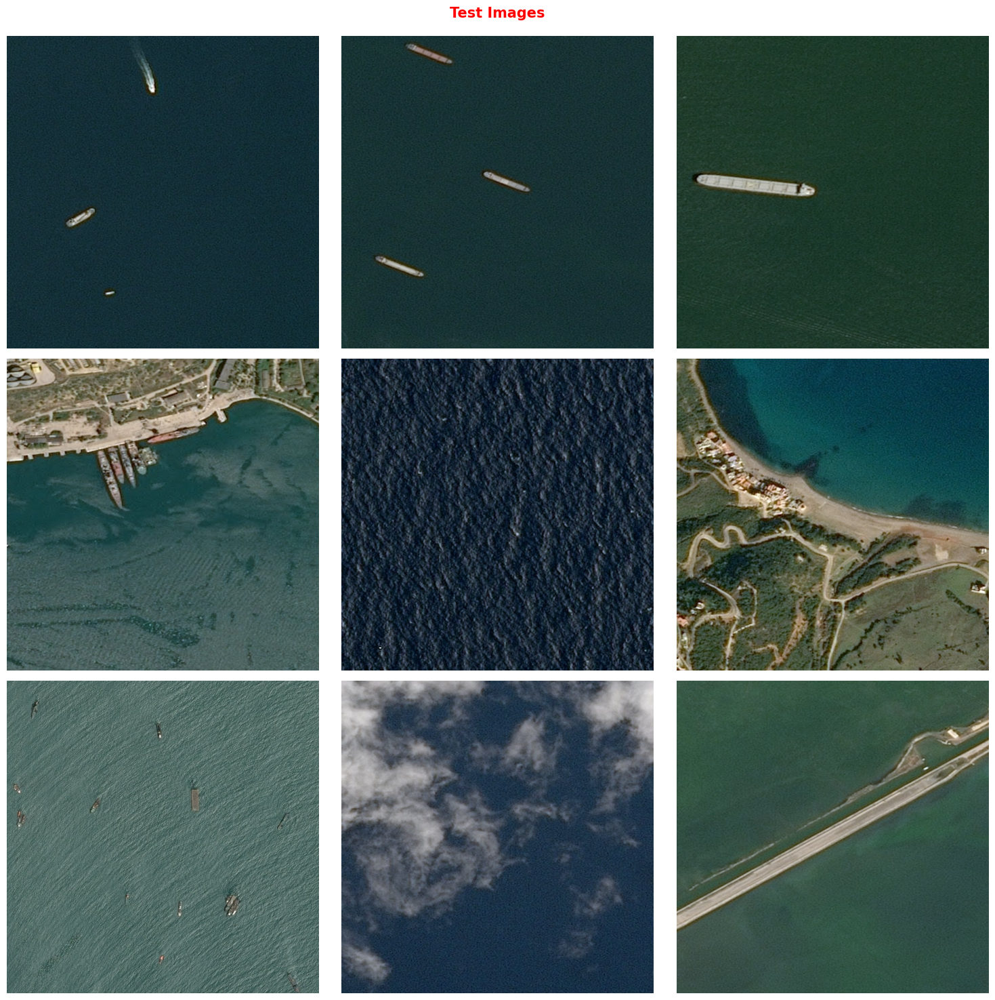

In [78]:
import matplotlib.pyplot as plt
from skimage.io import imread
import torchvision.transforms.functional as transform
from torchvision.utils import draw_bounding_boxes, draw_segmentation_masks

# testImage Path
testdir = '/content/drive/MyDrive/TestImages'
testimgs = os.listdir(testdir)

# original graph
plt.figure(figsize=(15,15))
plt.suptitle("Test Images\n", weight='bold', fontsize=15, color='r')
for i in range(9):
    img_id = testimgs[i]

    plt.subplot(3,3,i+1)
    plt.imshow(imread(f'{testdir}/{img_id}'))
    plt.axis('off')
plt.tight_layout()

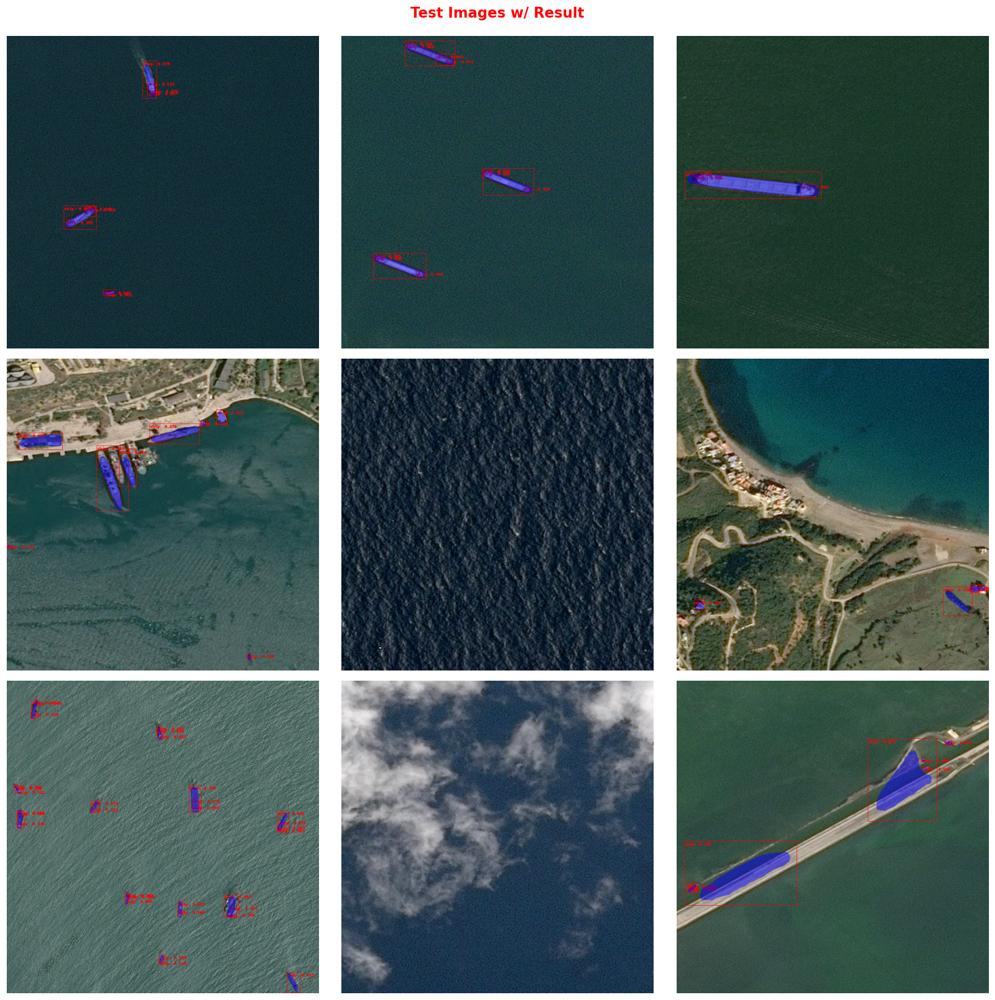

In [79]:
from torchvision.ops import nms
import torchvision.transforms.functional as F2

# model produced box and segmentations
model.eval()

plt.figure(figsize=(15,15))
plt.suptitle("Test Images w/ Result\n", weight='bold', fontsize=15, color='r')

for i in range(9):
    img_id = testimgs[i]

    PIL_image = Image.open(f'{testdir}/{img_id}')
    image = transform.to_tensor(PIL_image)

    eval_transform = get_transforms(train=False)

    with torch.no_grad():
        x = eval_transform(image)
        # convert RGBA -> RGB and move to device
        x = x[:3, ...].to(device)
        predictions = model([x, ])
        pred = predictions[0]

    # Apply Non-Maximum Suppression
    scores = pred['scores']
    boxes = pred['boxes']
    labels = pred['labels']
    masks = pred['masks']

    # Define IoU threshold for NMS
    iou_threshold = 0.3  # Adjust this threshold based on your requirements

    # Get indices of boxes to keep
    keep = nms(boxes, scores, iou_threshold)

    # Filter boxes, scores, labels, and masks using the indices from NMS
    filtered_boxes = boxes[keep]
    filtered_scores = scores[keep]
    filtered_labels = labels[keep]
    filtered_masks = masks[keep]

    # Draw filtered bounding boxes and masks
    image = (255.0 * (image - image.min()) / (image.max() - image.min())).to(torch.uint8)
    image = image[:3, ...]
    pred_labels = [f"ship: {score:.3f}" for score in filtered_scores]
    output_image = draw_bounding_boxes(image, filtered_boxes, pred_labels, colors="red")
    # filtered_masks = (pred["masks"] > 0.7).squeeze(1)
    output_image = draw_segmentation_masks(output_image, (filtered_masks > 0.7).squeeze(1), alpha=0.5, colors="blue")

    plt.subplot(3,3,i+1)
    plt.imshow(output_image.permute(1, 2, 0))
    plt.axis('off')
plt.tight_layout()
